In [2]:
pip install imblearn

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install ydata-profiling

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import warnings
warnings.filterwarnings('ignore')
from category_encoders import MEstimateEncoder
from imblearn.over_sampling import SMOTE
from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [4]:
df = pd.read_csv("application_record.csv")

In [5]:
df2 = pd.read_csv("credit_record.csv")

In [4]:
df.describe(include='all')

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
count,4.385570e+05,438557,438557,438557,438557.000000,4.385570e+05,438557,438557,438557,438557,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,304354,438557.000000
unique,NaN,2,2,2,NaN,NaN,5,5,5,6,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN
top,NaN,F,N,Y,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,Laborers,NaN
freq,NaN,294440,275459,304074,NaN,NaN,226104,301821,299828,393831,NaN,NaN,NaN,NaN,NaN,NaN,78240,NaN
mean,6.022176e+06,NaN,NaN,NaN,0.427390,1.875243e+05,NaN,NaN,NaN,NaN,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,NaN,2.194465
std,5.716370e+05,NaN,NaN,NaN,0.724882,1.100869e+05,NaN,NaN,NaN,NaN,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,NaN,0.897207
min,5.008804e+06,NaN,NaN,NaN,0.000000,2.610000e+04,NaN,NaN,NaN,NaN,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,NaN,1.000000
25%,5.609375e+06,NaN,NaN,NaN,0.000000,1.215000e+05,NaN,NaN,NaN,NaN,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
50%,6.047745e+06,NaN,NaN,NaN,0.000000,1.607805e+05,NaN,NaN,NaN,NaN,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
75%,6.456971e+06,NaN,NaN,NaN,1.000000,2.250000e+05,NaN,NaN,NaN,NaN,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,NaN,3.000000


In [5]:
df.shape

(438557, 18)

In [6]:
df2.describe(include='all')

,ID,MONTHS_BALANCE,STATUS
count,1.048575e+06,1.048575e+06,1048575
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,442031
mean,5.068286e+06,-1.913700e+01,NaN
std,4.615058e+04,1.402350e+01,NaN
min,5.001711e+06,-6.000000e+01,NaN
25%,5.023644e+06,-2.900000e+01,NaN
50%,5.062104e+06,-1.700000e+01,NaN
75%,5.113856e+06,-7.000000e+00,NaN


In [7]:
df2.shape

(1048575, 3)

In [8]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile = ProfileReport(df2)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
#each customer transaction history
grouped=df2.groupby('ID')['STATUS'].value_counts()
grouped

ID       STATUS
5001711  0          3
         X          1
5001712  0         10
         C          9
5001713  X         22
                   ..
5150483  X         18
5150484  0         12
         C          1
5150485  0          2
5150487  C         30
Name: STATUS, Length: 94143, dtype: int64

<AxesSubplot: xlabel='STATUS'>

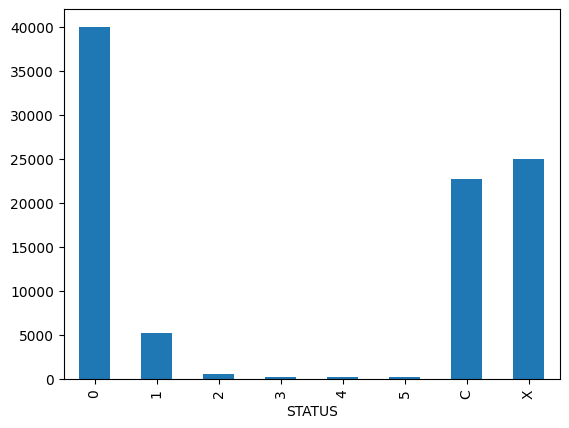

In [7]:
%matplotlib inline
z=grouped.groupby('STATUS').count()
z.plot(kind='bar')

#most customer had past due record of 1-29 days (0)
#second high is customer without a balance - did not use the card (X)
#third high is customer paid off the balance that month (C)
#low presentage on delinquent (1-5) 

<AxesSubplot: ylabel='STATUS'>

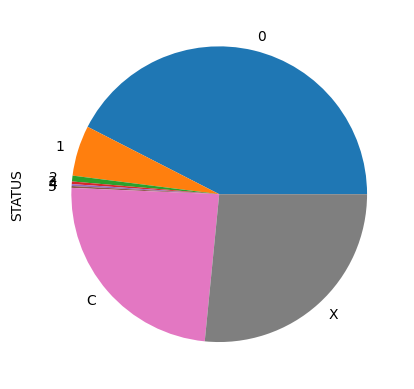

In [8]:
z.plot(kind='pie')

In [9]:
history=pd.get_dummies(data=df2,columns=['STATUS'],
                              prefix='',prefix_sep='').groupby('ID')[sorted(df2['STATUS'].unique().tolist())].sum()
history=history.rename(columns=
                      {'0':'pastdue',
                       '1':'30+',
                       '2':'60+',
                       '3':'90+',
                       '4':'120+',
                       '5':'150+',
                       'C':'paid_off',
                       'X':'no_usage',
                      })

overall_pastdue=['30+',	'60+',	'90+'	,'120+',	'150+']
history['number_of_months']=df2.groupby('ID')['MONTHS_BALANCE'].count()
history['over_90']=history[['90+','120+','150+']].sum(axis=1)
history['less_90']=history[['pastdue','30+','60+']].sum(axis=1)
history['overall_pastdue']=history[overall_pastdue].sum(axis=1)
history['pastdue_ratio']=round(history['pastdue']/ history['number_of_months'], 2)
history['overdue_ratio']=round(history['overall_pastdue']/ history['number_of_months'], 2)
history.head()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.0
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.0
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.0
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.0
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.0


In [7]:
history.sum()

pastdue              383120.00
30+                   11090.00
60+                     868.00
90+                     320.00
120+                    223.00
150+                   1693.00
paid_off             442031.00
no_usage             209230.00
number_of_months    1048575.00
over_90                2236.00
less_90              395078.00
overall_pastdue       14194.00
pastdue_ratio         21215.32
overdue_ratio           667.91
dtype: float64

In [8]:
history.head(20)

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.00
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.00
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.00
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.00
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.00
5001717,17,0,0,0,0,0,5,0,22,0,17,0,0.77,0.00
5001718,24,2,0,0,0,0,3,10,39,0,26,2,0.62,0.05
5001719,2,0,0,0,0,0,41,0,43,0,2,0,0.05,0.00
5001720,29,7,0,0,0,0,0,0,36,0,36,7,0.81,0.19


In [10]:
#specify dependent variable 
target=[]
for index,row in history.iterrows() :
  if row['number_of_months'] < 6 :
    target.append(1)
  elif row['150+'] > 0 or (row['no_usage'] == row['number_of_months']) or (row['over_90'] > row['less_90']):
    target.append(0)
  elif row['pastdue_ratio'] > 0.70 and row['overall_pastdue'] >= 1 :
    target.append(0) 
  elif row['overdue_ratio'] > 0.10 and row['over_90'] >= 1 :
    target.append(0)
  else:
    target.append(1)

history['class']=target
history['class'].value_counts()

1    40200
0     5785
Name: class, dtype: int64

In [10]:
#unbalance set
history.describe()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
count,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000
mean,8.331412,0.241166,0.018876,0.006959,0.004849,0.036816,9.612504,4.549962,22.802544,0.048625,8.591454,0.308666,0.461353,0.014525,0.874198
std,8.234128,0.990994,0.197607,0.101931,0.084188,0.855981,13.625156,9.622719,15.492771,0.935266,8.442478,1.512753,0.348173,0.061086,0.331630
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,3.000000,0.000000,0.150000,0.000000,1.000000
50%,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,19.000000,0.000000,6.000000,0.000000,0.410000,0.000000,1.000000
75%,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,3.000000,34.000000,0.000000,12.000000,0.000000,0.800000,0.000000,1.000000
max,61.000000,38.000000,8.000000,8.000000,7.000000,48.000000,60.000000,61.000000,61.000000,48.000000,61.000000,49.000000,1.000000,1.000000,1.000000


In [11]:
df.duplicated().sum()

0

In [11]:
#merging 2 sets
#leave the ones constructed the class label out
features=['number_of_months','class']
new_features=history.loc[:,features]
mdf=pd.merge(df,new_features,on='ID')
mdf.index=mdf['ID']
mdf.drop('ID',axis=1, inplace=True)
mdf.drop_duplicates(inplace=True)
mdf.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,class
ID,,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,16,1
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,15,1
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,30,1
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,5,1
5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,27,1


In [13]:
mdf.duplicated().sum()

0

In [14]:
mdf.describe()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,number_of_months,class
count,28083.000000,2.808300e+04,28083.000000,28083.000000,28083.0,28083.000000,28083.000000,28083.000000,28083.000000,28083.000000,28083.000000
mean,0.428088,1.865543e+05,-15978.420325,59187.125450,1.0,0.226543,0.294199,0.091692,2.198269,22.603746,0.873803
std,0.748417,1.011737e+05,4202.054256,137584.177672,0.0,0.418602,0.455690,0.288596,0.915138,15.199870,0.332078
min,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,0.000000,1.215000e+05,-19441.000000,-3153.000000,1.0,0.000000,0.000000,0.000000,2.000000,10.000000,1.000000
50%,0.000000,1.575000e+05,-15569.000000,-1539.000000,1.0,0.000000,0.000000,0.000000,2.000000,19.000000,1.000000
75%,1.000000,2.250000e+05,-12461.000000,-405.000000,1.0,0.000000,1.000000,0.000000,3.000000,33.000000,1.000000
max,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,61.000000,1.000000


In [15]:
mdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28083 entries, 5008804 to 5150337
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          28083 non-null  object 
 1   FLAG_OWN_CAR         28083 non-null  object 
 2   FLAG_OWN_REALTY      28083 non-null  object 
 3   CNT_CHILDREN         28083 non-null  int64  
 4   AMT_INCOME_TOTAL     28083 non-null  float64
 5   NAME_INCOME_TYPE     28083 non-null  object 
 6   NAME_EDUCATION_TYPE  28083 non-null  object 
 7   NAME_FAMILY_STATUS   28083 non-null  object 
 8   NAME_HOUSING_TYPE    28083 non-null  object 
 9   DAYS_BIRTH           28083 non-null  int64  
 10  DAYS_EMPLOYED        28083 non-null  int64  
 11  FLAG_MOBIL           28083 non-null  int64  
 12  FLAG_WORK_PHONE      28083 non-null  int64  
 13  FLAG_PHONE           28083 non-null  int64  
 14  FLAG_EMAIL           28083 non-null  int64  
 15  OCCUPATION_TYPE      19475 n

In [16]:
mdf.corr()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,number_of_months,class
CNT_CHILDREN,1.000000,0.029119,0.334121,-0.227424,NaN,0.042909,-0.022226,0.011322,0.890447,-0.007517,-0.009293
AMT_INCOME_TOTAL,0.029119,1.000000,0.065492,-0.168659,NaN,-0.032765,0.020283,0.090552,0.020743,0.022562,-0.038029
DAYS_BIRTH,0.334121,0.065492,1.000000,-0.614483,NaN,0.182343,-0.029467,0.104355,0.297257,-0.061375,-0.011624
DAYS_EMPLOYED,-0.227424,-0.168659,-0.614483,1.000000,NaN,-0.243377,-0.006729,-0.084019,-0.219954,-0.005415,0.013575
FLAG_MOBIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FLAG_WORK_PHONE,0.042909,-0.032765,0.182343,-0.243377,NaN,1.000000,0.304161,-0.034001,0.058527,0.016443,-0.002852
FLAG_PHONE,-0.022226,0.020283,-0.029467,-0.006729,NaN,0.304161,1.000000,0.012574,-0.012817,0.016055,-0.013262
FLAG_EMAIL,0.011322,0.090552,0.104355,-0.084019,NaN,-0.034001,0.012574,1.000000,0.008017,0.005166,-0.004846
CNT_FAM_MEMBERS,0.890447,0.020743,0.297257,-0.219954,NaN,0.058527,-0.012817,0.008017,1.000000,0.010635,-0.008476
number_of_months,-0.007517,0.022562,-0.061375,-0.005415,NaN,0.016443,0.016055,0.005166,0.010635,1.000000,-0.029266


In [12]:
profile = ProfileReport(mdf)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
mdf.corrwith(mdf['class'])*100

CNT_CHILDREN         -0.929257
AMT_INCOME_TOTAL     -3.802944
DAYS_BIRTH           -1.162360
DAYS_EMPLOYED         1.357487
FLAG_MOBIL                 NaN
FLAG_WORK_PHONE      -0.285183
FLAG_PHONE           -1.326218
FLAG_EMAIL           -0.484596
CNT_FAM_MEMBERS      -0.847586
number_of_months     -2.926613
class               100.000000
dtype: float64

In [17]:
mdf['OCCUPATION_TYPE'].unique()

array([nan, 'Security staff', 'Sales staff', 'Accountants', 'Laborers',
       'Managers', 'Drivers', 'Core staff', 'High skill tech staff',
       'Cleaning staff', 'Private service staff', 'Cooking staff',
       'Low-skill Laborers', 'Medicine staff', 'Secretaries',
       'Waiters/barmen staff', 'HR staff', 'Realty agents', 'IT staff'],
      dtype=object)

<AxesSubplot: >

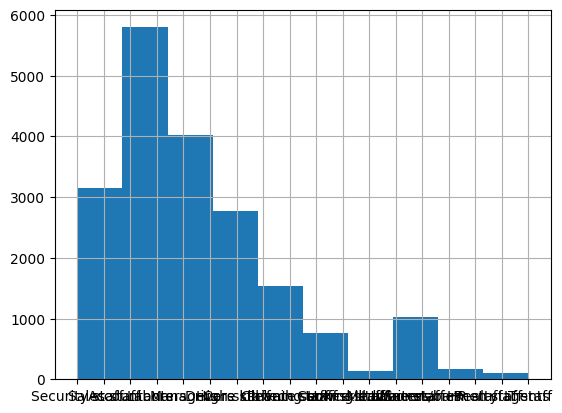

In [21]:
mdf['OCCUPATION_TYPE'].hist()

<AxesSubplot: xlabel='count', ylabel='OCCUPATION_TYPE'>

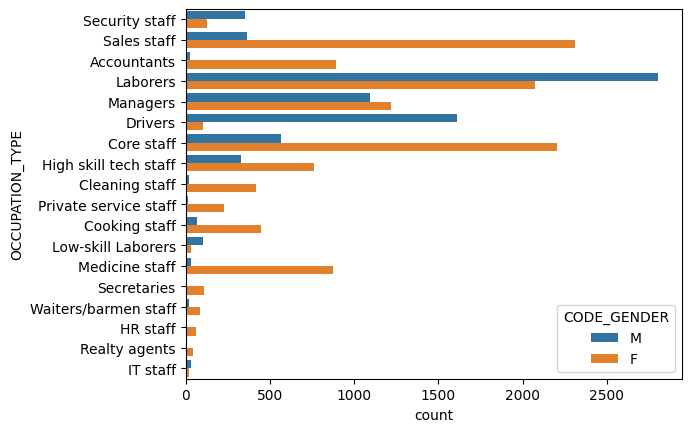

In [41]:
sns.countplot(y='OCCUPATION_TYPE',hue='CODE_GENDER',data=mdf)

In [159]:
#split the merged set into features and label
y = mdf['class']
x = mdf.drop(columns=['class'],axis=1)
x

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
ID,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,16
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,15
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,30
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,5
5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5149828,M,Y,Y,0,315000.0,Working,Secondary / secondary special,Married,House / apartment,-17348,-2420,1,0,0,0,Managers,2.0,12
5149834,F,N,Y,0,157500.0,Commercial associate,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,24
5149838,F,N,Y,0,157500.0,Pensioner,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,33


In [160]:
#split data into 70/30 training and testing sets
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=11)

In [161]:
#preprocess - missing value
x_train['OCCUPATION_TYPE'].fillna('Other',inplace=True)

In [162]:
cat_train=x_train.select_dtypes('object')
cat_train.nunique()

CODE_GENDER             2
FLAG_OWN_CAR            2
FLAG_OWN_REALTY         2
NAME_INCOME_TYPE        5
NAME_EDUCATION_TYPE     5
NAME_FAMILY_STATUS      5
NAME_HOUSING_TYPE       6
OCCUPATION_TYPE        19
dtype: int64

In [163]:
#since occupation type is high cardinality, use target encoding
from category_encoders import MEstimateEncoder
target=MEstimateEncoder(m=7,cols=['NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','OCCUPATION_TYPE'])
# train with 25% of the data to prevent overfitting 
x_encode=x_train.sample(frac=0.25)
y_encode=y_train[x_encode.index]
target.fit(x_encode,y_encode)
x_encoded=target.transform(x_train)
x_encoded['OCCUPATION_TYPE'].unique()


array([0.89157571, 0.88572297, 0.90052498, 0.8544083 , 0.88101253,
       0.86681712, 0.83170243, 0.87467523, 0.88151548, 0.85556829,
       0.92630886, 0.81051392, 0.90674543, 0.93822412, 0.82024902,
       0.8970402 , 0.92242942, 0.89098374, 0.94384011])

In [164]:
x_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19658 entries, 5029590 to 5053891
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          19658 non-null  object 
 1   FLAG_OWN_CAR         19658 non-null  object 
 2   FLAG_OWN_REALTY      19658 non-null  object 
 3   CNT_CHILDREN         19658 non-null  int64  
 4   AMT_INCOME_TOTAL     19658 non-null  float64
 5   NAME_INCOME_TYPE     19658 non-null  float64
 6   NAME_EDUCATION_TYPE  19658 non-null  float64
 7   NAME_FAMILY_STATUS   19658 non-null  float64
 8   NAME_HOUSING_TYPE    19658 non-null  float64
 9   DAYS_BIRTH           19658 non-null  int64  
 10  DAYS_EMPLOYED        19658 non-null  int64  
 11  FLAG_MOBIL           19658 non-null  int64  
 12  FLAG_WORK_PHONE      19658 non-null  int64  
 13  FLAG_PHONE           19658 non-null  int64  
 14  FLAG_EMAIL           19658 non-null  int64  
 15  OCCUPATION_TYPE      19658 n

In [165]:
#one-hot encoding for the rest of categorical features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for x in x_encoded:
    if x_encoded[x].dtypes=='object':
        x_encoded[x] = le.fit_transform(x_encoded[x])

In [166]:
x_encoded.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
ID,,,,,,,,,,,,,,,,,,
5029590,1,0,0,0,112500.0,0.889886,0.883013,0.873966,0.836261,-22981,365243,1,0,1,0,0.891576,2.0,5
5148503,0,0,1,0,225000.0,0.889886,0.883013,0.873966,0.878316,-21097,365243,1,0,1,0,0.891576,2.0,35
5112639,0,0,1,0,157500.0,0.877561,0.883013,0.867536,0.878316,-12942,-3253,1,0,0,0,0.891576,2.0,2
5054671,1,0,1,0,225000.0,0.870211,0.863375,0.900674,0.878316,-10182,-2403,1,0,0,0,0.885723,1.0,15
5090890,1,1,1,0,216000.0,0.889886,0.863375,0.873966,0.878316,-19631,365243,1,0,0,1,0.891576,2.0,14


In [30]:
#balancing the dataset - optional
#from imblearn.over_sampling import SMOTE
#oversample = SMOTE()
#x_smoted, y_smoted = oversample.fit_resample(x_encoded,y_encoded)
#y_smoted = pd.Series(y_smoted)
#y_smoted.value_counts()


1    17154
0    17154
Name: class, dtype: int64

In [31]:
#x_smoted.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
count,34308.000000,34308.000000,34308.000000,34308.000000,3.430800e+04,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.00000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000
mean,0.256791,0.298298,0.569051,0.352425,1.909543e+05,2.334762,3.036085,1.261776,1.244783,0.163927,0.21613,0.059170,0.870919,2.090066,22.756121,42.766439,5.269791
std,0.436870,0.457518,0.495216,0.689837,1.039655e+05,1.673901,1.300118,0.867366,0.868950,0.370215,0.41161,0.235946,0.019320,0.877153,14.392477,11.148368,6.232036
min,0.000000,0.000000,0.000000,0.000000,2.700000e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.809576,1.000000,1.000000,20.000000,-1.000000
25%,0.000000,0.000000,0.000000,0.000000,1.260000e+05,1.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.850415,2.000000,11.000000,34.000000,1.000000
50%,0.000000,0.000000,1.000000,0.000000,1.665000e+05,3.000000,4.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.872050,2.000000,20.000000,41.000000,4.000000
75%,1.000000,1.000000,1.000000,1.000000,2.250000e+05,4.000000,4.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.888806,2.000000,32.000000,51.000000,8.000000
max,1.000000,1.000000,1.000000,19.000000,1.575000e+06,4.000000,4.000000,4.000000,5.000000,1.000000,1.00000,1.000000,0.946874,20.000000,61.000000,68.000000,42.000000


In [32]:
# normalization - went with another method
# norm_train=(x_smoted-x_smoted.min())/(x_smoted.max()-x_smoted.min())
# print(norm_train)

       CODE_GENDER  FLAG_OWN_CAR  FLAG_OWN_REALTY  CNT_CHILDREN  \
0              0.0           0.0              0.0      0.000000   
1              1.0           1.0              1.0      0.105263   
2              0.0           0.0              0.0      0.000000   
3              0.0           0.0              1.0      0.000000   
4              0.0           0.0              1.0      0.000000   
...            ...           ...              ...           ...   
34303          0.0           0.0              1.0      0.000000   
34304          0.0           1.0              1.0      0.000000   
34305          0.0           0.0              0.0      0.000000   
34306          1.0           1.0              0.0      0.000000   
34307          0.0           0.0              0.0      0.000000   

       AMT_INCOME_TOTAL  NAME_INCOME_TYPE  NAME_EDUCATION_TYPE  \
0              0.098837              1.00                 1.00   
1              0.069767              1.00                 1.00 

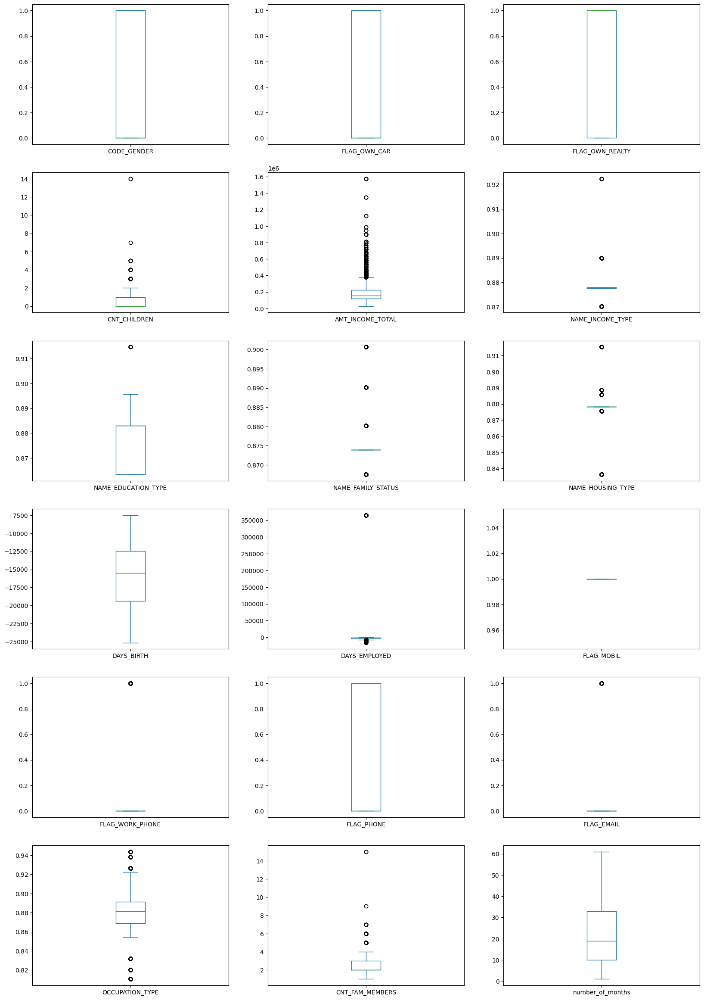

In [167]:
x_encoded.plot(kind='box', subplots=True, layout=(12,3), sharex=True, sharey=False, figsize=(20, 60))
plt.show()

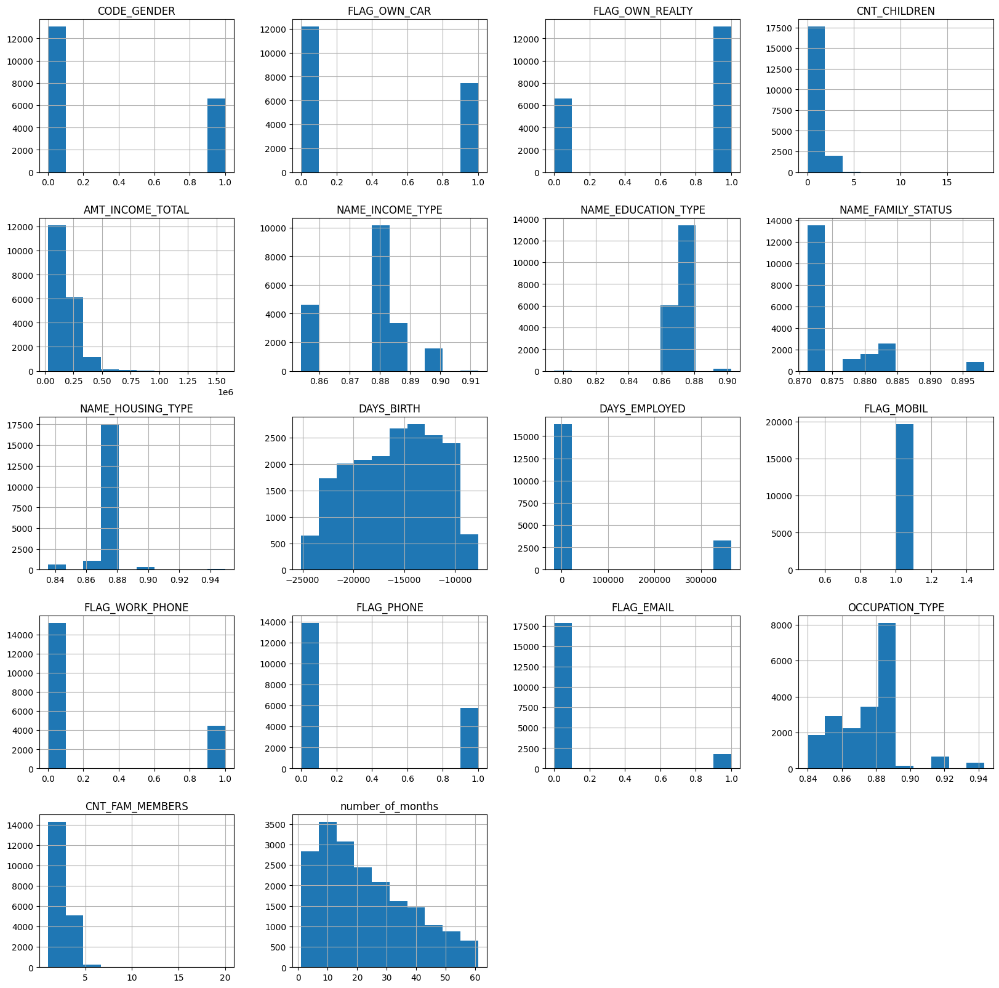

In [29]:
x_encoded.hist(figsize=(20, 20))
plt.show()

In [155]:
# create a copy of the label and the features
#label = y_train.copy()
#features_z = x_encoded.copy()

# Remove outliers using the Z-Score method
#z_scores = np.abs(stats.zscore(features_z))
#z_scores = z_scores.drop(['FLAG_MOBIL'],axis=1)
#features_z = features_z[(z_scores < 3).all(axis=1)]

# Get the cleaned feature indices
#cleaned_feature_indices = features_z.index

# Combine the target with the cleaned feature index
#y_encoded = label.loc[cleaned_feature_indices]
#features_z.reset_index()

# Print the number of rows in the dataframe before and after Z-Score outlier removal
#print("PRE Z-SCORE OUTLIER REMOVAL ROWS: {}".format(x_encoded.shape[0]))
#print("POST Z-SCORE OUTLIER REMOVAL ROWS: {}".format(features_z.shape[0]))

PRE Z-SCORE OUTLIER REMOVAL ROWS: 19658
POST Z-SCORE OUTLIER REMOVAL ROWS: 15751


In [178]:
# also tried with IQR method
label_iqr = y_train.copy()
features_iqr = x_encoded.copy()

def remove_outliers_iqr(data, factor=5):
    q1, q3 = np.percentile(data, [10, 90])
    iqr = q3 - q1
    lower_bound = q1 - factor * iqr
    upper_bound = q3 + factor * iqr
    mask = (data >= lower_bound) & (data <= upper_bound)
    return data[mask]

# Remove outliers using IQR method
rmfeatures_iqr = features_iqr.apply(remove_outliers_iqr, axis=0)

iqr_out = rmfeatures_iqr.dropna()

iqr_out

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
ID,,,,,,,,,,,,,,,,,,
5008806,1,1,1,0.0,112500.0,0.877848,0.883013,0.873966,0.878316,-21474,-1134,1,0,0,0.0,0.926309,2.0,30
5008812,0,0,1,0.0,283500.0,0.889886,0.863375,0.880211,0.878316,-22464,365243,1,0,0,0.0,0.891576,1.0,17
5008819,1,1,1,0.0,135000.0,0.870211,0.883013,0.873966,0.878316,-17778,-1194,1,0,0,0.0,0.881013,2.0,8
5008820,1,1,1,0.0,135000.0,0.870211,0.883013,0.873966,0.878316,-17778,-1194,1,0,0,0.0,0.881013,2.0,9
5008823,1,1,1,0.0,135000.0,0.870211,0.883013,0.873966,0.878316,-17778,-1194,1,0,0,0.0,0.881013,2.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5150480,0,1,1,1.0,157500.0,0.877848,0.883013,0.873966,0.878316,-10808,-1739,1,0,0,0.0,0.854408,3.0,26
5150481,0,1,1,1.0,157500.0,0.877848,0.883013,0.873966,0.878316,-10808,-1739,1,0,0,0.0,0.854408,3.0,43
5150482,0,1,1,1.0,157500.0,0.877848,0.883013,0.873966,0.878316,-10808,-1739,1,0,0,0.0,0.854408,3.0,18


In [179]:
cleaned_iqr_indices = iqr_out.index

# Combine the target with the cleaned feature index
y_encoded = y_train.loc[cleaned_iqr_indices]
iqr_out.reset_index()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
0,5008806,1,1,1,0.0,112500.0,0.877848,0.883013,0.873966,0.878316,-21474,-1134,1,0,0,0.0,0.926309,2.0,30
1,5008812,0,0,1,0.0,283500.0,0.889886,0.863375,0.880211,0.878316,-22464,365243,1,0,0,0.0,0.891576,1.0,17
2,5008819,1,1,1,0.0,135000.0,0.870211,0.883013,0.873966,0.878316,-17778,-1194,1,0,0,0.0,0.881013,2.0,8
3,5008820,1,1,1,0.0,135000.0,0.870211,0.883013,0.873966,0.878316,-17778,-1194,1,0,0,0.0,0.881013,2.0,9
4,5008823,1,1,1,0.0,135000.0,0.870211,0.883013,0.873966,0.878316,-17778,-1194,1,0,0,0.0,0.881013,2.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15944,5150480,0,1,1,1.0,157500.0,0.877848,0.883013,0.873966,0.878316,-10808,-1739,1,0,0,0.0,0.854408,3.0,26
15945,5150481,0,1,1,1.0,157500.0,0.877848,0.883013,0.873966,0.878316,-10808,-1739,1,0,0,0.0,0.854408,3.0,43
15946,5150482,0,1,1,1.0,157500.0,0.877848,0.883013,0.873966,0.878316,-10808,-1739,1,0,0,0.0,0.854408,3.0,18
15947,5150483,0,1,1,1.0,157500.0,0.877848,0.883013,0.873966,0.878316,-10808,-1739,1,0,0,0.0,0.854408,3.0,18


In [180]:
iqr_out.corr(method = 'spearman')

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
CODE_GENDER,1.000000,0.369087,-0.040264,0.093928,0.246755,-0.097381,0.015186,-0.072207,NaN,0.201221,-0.061144,NaN,0.047227,-0.033143,NaN,-0.185866,0.129377,0.009337
FLAG_OWN_CAR,0.369087,1.000000,-0.016515,0.106641,0.246189,-0.124035,-0.075934,-0.101351,NaN,0.165617,-0.098533,NaN,0.024573,-0.019796,NaN,-0.194338,0.161171,0.040508
FLAG_OWN_REALTY,-0.040264,-0.016515,1.000000,-0.001241,0.023353,0.064321,0.002574,0.027216,NaN,-0.120676,0.065874,NaN,-0.210807,-0.067818,NaN,0.035110,-0.013975,-0.027433
CNT_CHILDREN,0.093928,0.106641,-0.001241,1.000000,0.048964,-0.193994,-0.054119,-0.140187,NaN,0.418695,-0.147047,NaN,0.047415,-0.025845,NaN,-0.172138,0.822359,-0.013117
AMT_INCOME_TOTAL,0.246755,0.246189,0.023353,0.048964,1.000000,-0.229928,-0.183398,0.012926,NaN,0.110653,-0.169860,NaN,-0.048738,-0.014919,NaN,-0.219725,0.031038,0.039669
NAME_INCOME_TYPE,-0.097381,-0.124035,0.064321,-0.193994,-0.229928,1.000000,0.097186,0.081419,NaN,-0.454456,0.486206,NaN,-0.144253,0.002625,NaN,0.346377,-0.187444,-0.022557
NAME_EDUCATION_TYPE,0.015186,-0.075934,0.002574,-0.054119,-0.183398,0.097186,1.000000,-0.005982,NaN,-0.075998,0.051241,NaN,0.005498,-0.026438,NaN,0.137367,-0.048869,-0.022919
NAME_FAMILY_STATUS,-0.072207,-0.101351,0.027216,-0.140187,0.012926,0.081419,-0.005982,1.000000,NaN,-0.084845,0.065486,NaN,-0.059330,-0.012439,NaN,0.042025,-0.607465,-0.025849
NAME_HOUSING_TYPE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DAYS_BIRTH,0.201221,0.165617,-0.120676,0.418695,0.110653,-0.454456,-0.075998,-0.084845,NaN,1.000000,-0.260948,NaN,0.188517,-0.027608,NaN,-0.335641,0.354024,-0.049495


In [181]:
iqr_out.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15949 entries, 5008806 to 5150487
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          15949 non-null  int64  
 1   FLAG_OWN_CAR         15949 non-null  int64  
 2   FLAG_OWN_REALTY      15949 non-null  int64  
 3   CNT_CHILDREN         15949 non-null  float64
 4   AMT_INCOME_TOTAL     15949 non-null  float64
 5   NAME_INCOME_TYPE     15949 non-null  float64
 6   NAME_EDUCATION_TYPE  15949 non-null  float64
 7   NAME_FAMILY_STATUS   15949 non-null  float64
 8   NAME_HOUSING_TYPE    15949 non-null  float64
 9   DAYS_BIRTH           15949 non-null  int64  
 10  DAYS_EMPLOYED        15949 non-null  int64  
 11  FLAG_MOBIL           15949 non-null  int64  
 12  FLAG_WORK_PHONE      15949 non-null  int64  
 13  FLAG_PHONE           15949 non-null  int64  
 14  FLAG_EMAIL           15949 non-null  float64
 15  OCCUPATION_TYPE      15949 n

In [42]:
#dropping features which construct the depandent variable 'class' 
#also dropping the CNT_CHILDREN as highly correlated to CNT_FAM_MEMBER
processed_train = features.drop(['CNT_CHILDREN'], axis=1)

In [182]:
#filter method - Chi-Squared
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif


In [183]:
#feature extraction
test = SelectKBest(score_func=f_classif, k= 5)
fit = test.fit(iqr_out, y_encoded)

In [185]:
#summarize scores
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(iqr_out.columns)

In [186]:
#summarize selected features
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','F-value'] 
print(featureScores.nlargest(30,'F-value')) 

                Feature    F-value
4      AMT_INCOME_TOTAL  39.798085
17     number_of_months   8.939065
1          FLAG_OWN_CAR   7.437098
3          CNT_CHILDREN   6.460055
15      OCCUPATION_TYPE   5.275236
16      CNT_FAM_MEMBERS   5.181020
5      NAME_INCOME_TYPE   3.871155
10        DAYS_EMPLOYED   3.587123
0           CODE_GENDER   3.413762
2       FLAG_OWN_REALTY   2.931651
9            DAYS_BIRTH   2.873169
13           FLAG_PHONE   2.544316
6   NAME_EDUCATION_TYPE   1.872481
12      FLAG_WORK_PHONE   0.004325
7    NAME_FAMILY_STATUS   0.000063
8     NAME_HOUSING_TYPE  -4.371436
11           FLAG_MOBIL        NaN
14           FLAG_EMAIL        NaN


In [187]:
#wrapper method - RFE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [188]:
# Feature extraction
model = LogisticRegression(solver='liblinear')
rfe = RFE(model, n_features_to_select=5)
fit = rfe.fit(iqr_out, y_encoded)
selected = pd.DataFrame(fit.support_)
dfcolumns = pd.DataFrame(iqr_out.columns)
rankings = pd.DataFrame(fit.ranking_)
choosenwrap = pd.concat([dfcolumns,selected,rankings],axis=1)
choosenwrap.columns = ['Feature','RFE_Selected','RFE_Ranks'] 
print(choosenwrap.nlargest(30,'RFE_Ranks')) 

                Feature  RFE_Selected  RFE_Ranks
14           FLAG_EMAIL         False         14
1          FLAG_OWN_CAR         False         13
13           FLAG_PHONE         False         12
0           CODE_GENDER         False         11
12      FLAG_WORK_PHONE         False         10
3          CNT_CHILDREN         False          9
2       FLAG_OWN_REALTY         False          8
5      NAME_INCOME_TYPE         False          7
7    NAME_FAMILY_STATUS         False          6
8     NAME_HOUSING_TYPE         False          5
6   NAME_EDUCATION_TYPE         False          4
15      OCCUPATION_TYPE         False          3
11           FLAG_MOBIL         False          2
16      CNT_FAM_MEMBERS          True          1
9            DAYS_BIRTH          True          1
10        DAYS_EMPLOYED          True          1
4      AMT_INCOME_TOTAL          True          1
17     number_of_months          True          1


In [189]:
#extra trees forest
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier(n_estimators=14)
model.fit(iqr_out, y_encoded)
feature_importances = pd.DataFrame(model.feature_importances_)
featuretree = pd.concat([dfcolumns,feature_importances],axis=1)
featuretree.columns = ['Feature','XTree_Classifier'] 
print(featuretree.nlargest(30,'XTree_Classifier'))

                Feature  XTree_Classifier
17     number_of_months          0.355380
9            DAYS_BIRTH          0.140590
4      AMT_INCOME_TOTAL          0.124211
10        DAYS_EMPLOYED          0.096651
15      OCCUPATION_TYPE          0.071850
5      NAME_INCOME_TYPE          0.036892
7    NAME_FAMILY_STATUS          0.030991
6   NAME_EDUCATION_TYPE          0.030614
16      CNT_FAM_MEMBERS          0.022777
2       FLAG_OWN_REALTY          0.021461
3          CNT_CHILDREN          0.017816
12      FLAG_WORK_PHONE          0.015736
13           FLAG_PHONE          0.013947
1          FLAG_OWN_CAR          0.012419
0           CODE_GENDER          0.008668
8     NAME_HOUSING_TYPE          0.000000
11           FLAG_MOBIL          0.000000
14           FLAG_EMAIL          0.000000


In [190]:
dff=pd.merge(featureScores, choosenwrap, on=["Feature"])
feature_selection_df = pd.merge(dff, featuretree, on=["Feature"])
feature_selection_df.sort_values(by="XTree_Classifier",ascending=False)

,Feature,F-value,RFE_Selected,RFE_Ranks,XTree_Classifier
17,number_of_months,8.939065,True,1,0.355380
9,DAYS_BIRTH,2.873169,True,1,0.140590
4,AMT_INCOME_TOTAL,39.798085,True,1,0.124211
10,DAYS_EMPLOYED,3.587123,True,1,0.096651
15,OCCUPATION_TYPE,5.275236,False,3,0.071850
5,NAME_INCOME_TYPE,3.871155,False,7,0.036892
7,NAME_FAMILY_STATUS,0.000063,False,6,0.030991
6,NAME_EDUCATION_TYPE,1.872481,False,4,0.030614
16,CNT_FAM_MEMBERS,5.181020,True,1,0.022777
2,FLAG_OWN_REALTY,2.931651,False,8,0.021461


In [193]:
#dropping features used in modeling were selected according to feature selection methods
processed_train = iqr_out.drop(['FLAG_EMAIL','FLAG_MOBIL','NAME_HOUSING_TYPE','CNT_CHILDREN'], axis=1)

<AxesSubplot: >

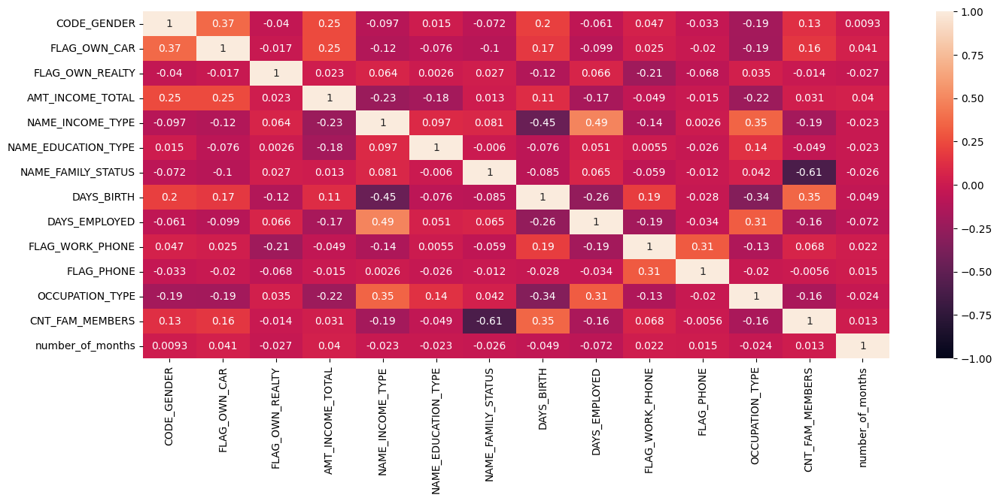

In [194]:
plt.figure(figsize=(16, 6))
sns.heatmap(processed_train.corr(method='spearman'),vmin=-1, vmax=1, annot=True)

In [195]:
processed_train.skew()

CODE_GENDER            0.752659
FLAG_OWN_CAR           0.526100
FLAG_OWN_REALTY       -0.812602
AMT_INCOME_TOTAL       2.150156
NAME_INCOME_TYPE       0.660086
NAME_EDUCATION_TYPE   -0.705378
NAME_FAMILY_STATUS     1.696319
DAYS_BIRTH            -0.107651
DAYS_EMPLOYED          1.584021
FLAG_WORK_PHONE        1.291420
FLAG_PHONE             0.875464
OCCUPATION_TYPE       -0.748667
CNT_FAM_MEMBERS        0.965818
number_of_months       0.620046
dtype: float64

In [196]:
processed_train.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
count,15949.000000,15949.000000,15949.000000,1.594900e+04,15949.000000,15949.000000,15949.000000,15949.000000,15949.000000,15949.000000,15949.000000,15949.000000,15949.000000,15949.000000
mean,0.323907,0.372813,0.688194,1.842974e+05,0.878423,0.878361,0.877749,-16346.378582,66996.582105,0.228792,0.299517,0.878504,2.196815,22.787949
std,0.467980,0.483568,0.463246,9.721438e+04,0.006345,0.009221,0.009402,4171.038007,144223.544904,0.420068,0.458061,0.021998,0.899279,15.399290
min,0.000000,0.000000,0.000000,2.700000e+04,0.870211,0.863375,0.867536,-25140.000000,-15713.000000,0.000000,0.000000,0.810514,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.170000e+05,0.877561,0.863375,0.873966,-19826.000000,-3193.000000,0.000000,0.000000,0.874675,2.000000,10.000000
50%,0.000000,0.000000,1.000000,1.575000e+05,0.877848,0.883013,0.873966,-16009.000000,-1539.000000,0.000000,0.000000,0.881515,2.000000,20.000000
75%,1.000000,1.000000,1.000000,2.250000e+05,0.877848,0.883013,0.873966,-12943.000000,-341.000000,0.000000,1.000000,0.891576,3.000000,34.000000
max,1.000000,1.000000,1.000000,1.125000e+06,0.922429,0.914672,0.900674,-7959.000000,365243.000000,1.000000,1.000000,0.943840,9.000000,61.000000


In [197]:
#prepare test dataset
#missing values
x_test['OCCUPATION_TYPE'].fillna('Other',inplace=True)
#target encoding
x_test_encoded=target.transform(x_test)
#one-hot encoding
for x in x_test_encoded:
    if x_test_encoded[x].dtypes=='object':
        x_test_encoded[x] = le.fit_transform(x_test_encoded[x])
#drop features
x_test_encoded=x_test_encoded.drop(['FLAG_EMAIL','FLAG_MOBIL','NAME_HOUSING_TYPE','CNT_CHILDREN'],axis=1)
#rb_test = RobustScaler(quantile_range=(25, 75)).fit_transform(x_test_encoded)

In [198]:
x_train = processed_train.copy()
y_train = y_encoded.copy()
x_test = x_test_encoded.copy()

In [199]:
print(x_test.shape)
print(x_train.shape)
print(y_test.shape)
print(y_train.shape)

(8425, 14)
(15949, 14)
(8425,)
(15949,)


In [203]:
#modeling - Logistic Regression, K-Nearest Neighbors, Support Vector Machine (SVM), Decision Tree, Random Forest
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import *
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.compose import make_column_transformer
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import QuantileTransformer
from pprint import pprint

1st quick modeling with scaling and features selection

In [204]:

qt = QuantileTransformer(output_distribution='normal',n_quantiles=2000, random_state=35)
fs = SelectKBest(score_func=f_classif, k=5)
classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="rbf", C=0.025, probability=True),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    LogisticRegression()
    ]
for classifier in classifiers:
    steps = [
        ('preprocess', qt),
        ('select', fs),
        ('clf', classifier)
    ]
    pipeline = Pipeline(steps)
    pipeline.fit(x_train, y_train)   
    print(classifier)
    print("model score: %.3f" % pipeline.score(x_test, y_test))

KNeighborsClassifier(n_neighbors=3)
model score: 0.837
SVC(C=0.025, probability=True)
model score: 0.874
DecisionTreeClassifier()
model score: 0.766
RandomForestClassifier()
model score: 0.835
LogisticRegression()
model score: 0.874


In [205]:
pt = PowerTransformer(method="yeo-johnson")
fs = SelectKBest(score_func=f_classif, k=5)
classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="rbf", C=0.025, probability=True),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    LogisticRegression()
    ]
for classifier in classifiers:
    steps = [
        ('preprocess', pt),
        ('select', fs),
        ('clf', classifier)
    ]
    pipeline = Pipeline(steps)
    pipeline.fit(x_train, y_train)   
    print(classifier)
    print("model score: %.3f" % pipeline.score(x_test, y_test))

KNeighborsClassifier(n_neighbors=3)
model score: 0.835
SVC(C=0.025, probability=True)
model score: 0.874
DecisionTreeClassifier()
model score: 0.779
RandomForestClassifier()
model score: 0.835
LogisticRegression()
model score: 0.874


In [206]:
from sklearn.preprocessing import RobustScaler
rb = RobustScaler()
fs = SelectKBest(score_func=f_classif, k=5)
classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="rbf", C=0.025, probability=True),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    LogisticRegression()
    ]
for classifier in classifiers:
    steps = [
        ('preprocess', rb),
        ('select', fs),
        ('clf', classifier)
    ]
    pipeline = Pipeline(steps)
    pipeline.fit(x_train, y_train)   
    print(classifier)
    print("model score: %.3f" % pipeline.score(x_test, y_test))

KNeighborsClassifier(n_neighbors=3)
model score: 0.841
SVC(C=0.025, probability=True)
model score: 0.874
DecisionTreeClassifier()
model score: 0.770
RandomForestClassifier()
model score: 0.840
LogisticRegression()
model score: 0.874


In [ ]:
pipeline.get_feature_names()

Note: 1st modeling with different method of scaling shows that there are not much difference on the accuracy score, 
but knn is more sensitive to sacling as it is a distance-based algorithm.

2nd modeling without scaling and random parameters - saving all evaluation metrics

In [228]:
#Logistic Regression
lr = LogisticRegression(class_weight= {0:0.77,1:0.23},C=1)
lr.fit(x_train, y_train)
train_pred = lr.predict(x_train)
test_pred = lr.predict(x_test)
trainproba = lr.predict_proba(x_train)[:,1]
testproba = lr.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

   0     1
0  2  1058
1  3  7362


In [229]:
#calculate train accuracy 
lr_train_accuracy = accuracy_score(y_train,train_pred)
lr_train_precision = precision_score(y_train,train_pred)
lr_train_recall = recall_score(y_train,train_pred)
lr_train_f1 = f1_score(y_train,train_pred)
lr_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
lr_test_accuracy = accuracy_score(y_test,test_pred)
lr_test_precision = precision_score(y_test,test_pred)
lr_test_recall = recall_score(y_test,test_pred)
lr_test_f1 = f1_score(y_test,test_pred)
lr_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.87523
Train precision score = 0.8755
Train recall score = 0.99964
Train F1 score = 0.93346
Train AUC score = 0.52518
Test accuracy score = 0.87407
Test precision score = 0.87435
Test recall score = 0.99959
Test F1 score = 0.93278
Test AUC score = 0.5108


In [230]:
#store the result
lr_results = pd.DataFrame(['Logistic Regression',lr_train_accuracy, lr_train_precision, 
                           lr_train_recall, lr_train_f1, lr_train_auc, lr_test_accuracy, lr_test_precision,
                           lr_test_recall, lr_test_f1, lr_test_auc]).transpose()
lr_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [231]:
#knn
knn = KNeighborsClassifier(p=1, weights='distance')
knn.fit(x_train, y_train)
train_pred = knn.predict(x_train)
test_pred = knn.predict(x_test)
trainproba = knn.predict_proba(x_train)[:,1]
testproba = knn.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

     0     1
0  189   871
1  517  6848


In [232]:
#calculate train accuracy 
knn_train_accuracy = accuracy_score(y_train,train_pred)
knn_train_precision = precision_score(y_train,train_pred)
knn_train_recall = recall_score(y_train,train_pred)
knn_train_f1 = f1_score(y_train,train_pred)
knn_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
knn_test_accuracy = accuracy_score(y_test,test_pred)
knn_test_precision = precision_score(y_test,test_pred)
knn_test_recall = recall_score(y_test,test_pred)
knn_test_f1 = f1_score(y_test,test_pred)
knn_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.98338
Train precision score = 1.0
Train recall score = 0.98102
Train F1 score = 0.99042
Train AUC score = 0.99873
Test accuracy score = 0.83525
Test precision score = 0.88716
Test recall score = 0.9298
Test F1 score = 0.90798
Test AUC score = 0.57296


In [233]:
knn_results = pd.DataFrame(['K-Nearest Neighbors',knn_train_accuracy, knn_train_precision, 
                           knn_train_recall, knn_train_f1, knn_train_auc, knn_test_accuracy, knn_test_precision,
                           knn_test_recall, knn_test_f1, knn_test_auc]).transpose()
knn_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [234]:
#Decision Tree
dt = DecisionTreeClassifier(criterion="entropy")
dt.fit(x_train, y_train)
train_pred = dt.predict(x_train)
test_pred = dt.predict(x_test)
trainproba = dt.predict_proba(x_train)[:,1]
testproba = dt.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

     0     1
0  239   821
1  928  6437


In [235]:
#calculate train accuracy 
dt_train_accuracy = accuracy_score(y_train,train_pred)
dt_train_precision = precision_score(y_train,train_pred)
dt_train_recall = recall_score(y_train,train_pred)
dt_train_f1 = f1_score(y_train,train_pred)
dt_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
dt_test_accuracy = accuracy_score(y_test,test_pred)
dt_test_precision = precision_score(y_test,test_pred)
dt_test_recall = recall_score(y_test,test_pred)
dt_test_f1 = f1_score(y_test,test_pred)
dt_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.98338
Train precision score = 1.0
Train recall score = 0.98102
Train F1 score = 0.99042
Train AUC score = 0.99873
Test accuracy score = 0.7924
Test precision score = 0.88688
Test recall score = 0.874
Test F1 score = 0.88039
Test AUC score = 0.54912


In [236]:
dt_results = pd.DataFrame(['Decision Tree',dt_train_accuracy, dt_train_precision, 
                           dt_train_recall, dt_train_f1, dt_train_auc, dt_test_accuracy, dt_test_precision,
                           dt_test_recall, dt_test_f1, dt_test_auc]).transpose()
dt_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [237]:
#Random Forest
rf = RandomForestClassifier(n_estimators=1000,max_depth=20,random_state = 80)
rf.fit(x_train, y_train)
train_pred = rf.predict(x_train)
test_pred = rf.predict(x_test)
trainproba = rf.predict_proba(x_train)[:,1]
testproba = rf.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

     0     1
0   66   994
1  153  7212


In [238]:
#calculate train accuracy 
rf_train_accuracy = accuracy_score(y_train,train_pred)
rf_train_precision = precision_score(y_train,train_pred)
rf_train_recall = recall_score(y_train,train_pred)
rf_train_f1 = f1_score(y_train,train_pred)
rf_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
rf_test_accuracy = accuracy_score(y_test,test_pred)
rf_test_precision = precision_score(y_test,test_pred)
rf_test_recall = recall_score(y_test,test_pred)
rf_test_f1 = f1_score(y_test,test_pred)
rf_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.95109
Train precision score = 0.94752
Train recall score = 0.9995
Train F1 score = 0.97282
Train AUC score = 0.99617
Test accuracy score = 0.86386
Test precision score = 0.87887
Test recall score = 0.97923
Test F1 score = 0.92634
Test AUC score = 0.66974


In [239]:
rf_results = pd.DataFrame(['Random Forest',rf_train_accuracy, rf_train_precision, 
                           rf_train_recall, rf_train_f1, rf_train_auc, rf_test_accuracy, rf_test_precision,
                           rf_test_recall, rf_test_f1, rf_test_auc]).transpose()
rf_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [241]:
#SVC
svc = SVC(probability=True)
svc.fit(x_train, y_train)
train_pred = svc.predict(x_train)
test_pred = svc.predict(x_test)
trainproba = svc.predict_proba(x_train)[:,1]
testproba = svc.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))

   0     1
0  0  1060
1  0  7365


In [242]:
#calculate train accuracy 
svc_train_accuracy = accuracy_score(y_train,train_pred)
svc_train_precision = precision_score(y_train,train_pred)
svc_train_recall = recall_score(y_train,train_pred)
svc_train_f1 = f1_score(y_train,train_pred)
svc_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
svc_test_accuracy = accuracy_score(y_test,test_pred)
svc_test_precision = precision_score(y_test,test_pred)
svc_test_recall = recall_score(y_test,test_pred)
svc_test_f1 = f1_score(y_test,test_pred)
svc_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

Train accuracy score = 0.87554
Train precision score = 0.87554
Train recall score = 1.0
Train F1 score = 0.93364
Train AUC score = 0.53938
Test accuracy score = 0.87418
Test precision score = 0.87418
Test recall score = 1.0
Test F1 score = 0.93287
Test AUC score = 0.53255


In [243]:
svc_results = pd.DataFrame(['SVC',svc_train_accuracy, svc_train_precision, 
                           svc_train_recall, svc_train_f1, svc_train_auc, svc_test_accuracy, svc_test_precision,
                           svc_test_recall, svc_test_f1, svc_test_auc]).transpose()

svc_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [244]:
model_result = pd.concat([lr_results, knn_results, dt_results, rf_results, svc_results])

In [245]:
model_result

,Classifier,Train_accuracy,Train_presicion,Train_recall,Train_f1,Train_AUC,Test_accuracy,Test_presicion,Test_recall,Test_f1,Test_AUC
0,Logistic Regression,0.875227,0.875502,0.999642,0.933463,0.525181,0.874065,0.874347,0.999593,0.932784,0.510799
0,K-Nearest Neighbors,0.983385,1.0,0.981023,0.99042,0.998733,0.835252,0.887162,0.929803,0.907982,0.572962
0,Decision Tree,0.983385,1.0,0.981023,0.99042,0.998733,0.792404,0.886883,0.873999,0.880394,0.549123
0,Random Forest,0.951094,0.947522,0.999499,0.972817,0.996165,0.863858,0.878869,0.979226,0.926337,0.669744
0,SVC,0.875541,0.875541,1.0,0.933641,0.53938,0.874184,0.874184,1.0,0.932869,0.53255


In [247]:
model_train_result = model_result.iloc[:,:6]
model_test_result = model_result.drop(['Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC'], axis=1)

In [248]:
model_train_result

,Classifier,Train_accuracy,Train_presicion,Train_recall,Train_f1,Train_AUC
0,Logistic Regression,0.875227,0.875502,0.999642,0.933463,0.525181
0,K-Nearest Neighbors,0.983385,1.0,0.981023,0.99042,0.998733
0,Decision Tree,0.983385,1.0,0.981023,0.99042,0.998733
0,Random Forest,0.951094,0.947522,0.999499,0.972817,0.996165
0,SVC,0.875541,0.875541,1.0,0.933641,0.53938


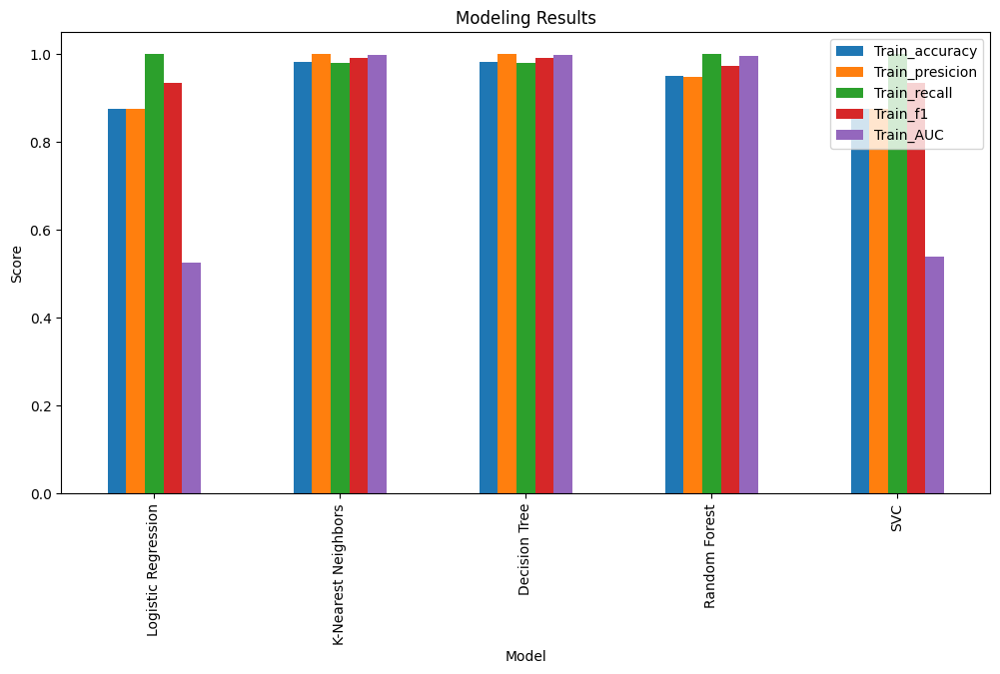

In [259]:
# Set the model names as the index
#model_train_result.set_index('Classifier', inplace=True)

# Plot the results
fig, ax = plt.subplots(figsize=(12,6))
model_train_result.plot(kind='bar', ax=ax)
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Modeling Results')
plt.show()

In [260]:
model_test_result

,Classifier,Test_accuracy,Test_presicion,Test_recall,Test_f1,Test_AUC
0,Logistic Regression,0.874065,0.874347,0.999593,0.932784,0.510799
0,K-Nearest Neighbors,0.835252,0.887162,0.929803,0.907982,0.572962
0,Decision Tree,0.792404,0.886883,0.873999,0.880394,0.549123
0,Random Forest,0.863858,0.878869,0.979226,0.926337,0.669744
0,SVC,0.874184,0.874184,1.0,0.932869,0.53255


Note: 2nd modeling shows that the AUC is lower on LR and SVC for the training set. The result on other evaluation metrics are quite high, it might be overfitting still. The testing result on accuracy, presicion, recall, and f1 on all models are over 70, but AUC on all models are below 70. The highest accuracy model are LR and SVC with 87.4, the highest presicion are Knn and DT with 88.7, the highest recall are LR and SVC at 100, the highest F1 are LR and SVC with 93.2, the highest AUC is RF with 66.9

In [265]:
#3rd modeling - hyperparameter scaling modeling randomsearchcv repeated stratifired k-fold timer
steps = [
    ('scaler', RobustScaler()),
    ('rf', RandomForestClassifier())]
pipeline = Pipeline(steps=steps)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=12)
from pprint import pprint
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [8, 10, 12]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
criterion = ['gini', 'entropy', 'log_loss']
# Create the random grid
random_grid = {'rf__n_estimators': n_estimators,
               'rf__max_features': max_features,
               'rf__max_depth': max_depth,
               'rf__min_samples_split': min_samples_split,
               'rf__min_samples_leaf': min_samples_leaf,
               'rf__bootstrap': bootstrap,
               'rf__criterion': criterion}
pprint(random_grid)
ran_rf = RandomizedSearchCV(pipeline, random_grid,cv=cv, n_jobs=-1, scoring='roc_auc',n_iter=8)

{'rf__bootstrap': [True, False],
 'rf__criterion': ['gini', 'entropy', 'log_loss'],
 'rf__max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'rf__max_features': ['auto', 'sqrt', 'log2'],
 'rf__min_samples_leaf': [1, 2, 4],
 'rf__min_samples_split': [8, 10, 12],
 'rf__n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [266]:
%%time
ran_rf.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the pas

CPU times: user 10.7 s, sys: 316 ms, total: 11 s
Wall time: 11min 35s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                             ('rf', RandomForestClassifier())]),
                   n_iter=8, n_jobs=-1,
                   param_distributions={'rf__bootstrap': [True, False],
                                        'rf__criterion': ['gini', 'entropy',
                                                          'log_loss'],
                                        'rf__max_depth': [10, 20, 30, 40, 50,
                                                          60, 70, 80, 90, 100,
                                                          110, None],
                                        'rf__max_features': ['auto', 'sqrt',
                                                             'log2'],
                                        'rf__min_samples_leaf': [1, 2, 4],
                                        'rf__min_samples_split': [8, 10, 12],
                                        'rf__n_estimators': [200, 400, 600, 800,
                                                             1000, 1200, 1400,
                                                             1600, 1800,
                                                             2000]},
                   scoring='roc_auc')

In [267]:
ran_rf.best_params_

{'rf__n_estimators': 600,
 'rf__min_samples_split': 12,
 'rf__min_samples_leaf': 2,
 'rf__max_features': 'auto',
 'rf__max_depth': 80,
 'rf__criterion': 'entropy',
 'rf__bootstrap': True}

In [268]:
ran_rf.best_score_

0.674366578600928

#4th modeling - final compare with the best parameters

In [269]:
rf2 = RandomForestClassifier(
                           n_estimators = ran_rf.best_params_['rf__n_estimators'],
                           max_features = ran_rf.best_params_['rf__max_features'],
                           max_depth = ran_rf.best_params_['rf__max_depth'],
                           bootstrap = ran_rf.best_params_['rf__bootstrap'],
                           min_samples_leaf = ran_rf.best_params_['rf__min_samples_leaf'],
                           min_samples_split = ran_rf.best_params_['rf__min_samples_split'],
                           criterion = ran_rf.best_params_['rf__criterion'],
                           random_state = 0)
    
rf2.fit(x_train, y_train)

n_scores = cross_val_score(rf2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

Cross Validation Scores:  [0.67193262 0.7037254  0.65772293 0.66220788 0.67897483 0.680682
 0.6623914  0.6734031  0.66239095 0.68533386]
Average CV Score:  0.6738764986009083
Number of CV Scores used in Average:  10


In [270]:
train_pred = rf2.predict(x_train)
test_pred = rf2.predict(x_test)
trainproba = rf2.predict_proba(x_train)[:,1]
testproba = rf2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
rf2_train_accuracy = accuracy_score(y_train,train_pred)
rf2_train_precision = precision_score(y_train,train_pred)
rf2_train_recall = recall_score(y_train,train_pred)
rf2_train_f1 = f1_score(y_train,train_pred)
rf2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
rf2_test_accuracy = accuracy_score(y_test,test_pred)
rf2_test_precision = precision_score(y_test,test_pred)
rf2_test_recall = recall_score(y_test,test_pred)
rf2_test_f1 = f1_score(y_test,test_pred)
rf2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

    0     1
0  15  1045
1  19  7346
Train accuracy score = 0.88689
Train precision score = 0.88628
Train recall score = 0.999
Train F1 score = 0.93927
Train AUC score = 0.98183
Test accuracy score = 0.87371
Test precision score = 0.87546
Test recall score = 0.99742
Test F1 score = 0.93247
Test AUC score = 0.67578


In [271]:
rf2_results = pd.DataFrame(['Tuned Random Forest',rf2_train_accuracy, rf2_train_precision, 
                           rf2_train_recall, rf2_train_f1, rf2_train_auc, rf2_test_accuracy, rf2_test_precision,
                           rf2_test_recall, rf2_test_f1, rf2_test_auc]).transpose()
rf2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [273]:
steps = [
    ('scaler', RobustScaler()),
    ('lr', LogisticRegression())]
pipeline = Pipeline(steps=steps)
solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
penalty = ['none', 'l1', 'l2', 'elasticnet']
C = np.logspace(-4, 4, 20)
max_iter = [10, 100, 500, 1000, 5000]
lr_grid = {'lr__solver': solver,
           'lr__penalty': penalty,
           'lr__C': C,
           'lr__max_iter': max_iter}
pprint(lr_grid)
ran_lr = RandomizedSearchCV(pipeline, lr_grid, cv=cv, n_jobs=-1, scoring='roc_auc')

{'lr__C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
 'lr__max_iter': [10, 100, 500, 1000, 5000],
 'lr__penalty': ['none', 'l1', 'l2', 'elasticnet'],
 'lr__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}


In [274]:
%%time
ran_lr.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Library/Frameworks/Python.frame

CPU times: user 625 ms, sys: 296 ms, total: 921 ms
Wall time: 19.6 s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                             ('lr', LogisticRegression())]),
                   n_jobs=-1,
                   param_distributions={'lr__C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                                        'lr__max_iter': [10, 100, 500, 1000,
                                                         5000],
                                        'lr__penalty': ['none', 'l1', 'l2',
                                                        'elasticnet'],
                                        'lr__solver': ['newton-cg', 'lbfgs',
                                                       'liblinear', 'sag',
                                                       'saga']},
                   scoring='roc_auc')

In [275]:
ran_lr.best_params_

{'lr__solver': 'liblinear',
 'lr__penalty': 'l1',
 'lr__max_iter': 10,
 'lr__C': 29.763514416313132}

In [276]:
ran_lr.best_score_

0.5410561235717808

In [280]:
from imblearn.over_sampling import SMOTE

In [284]:
lr2 = LogisticRegression(
                           solver = ran_lr.best_params_['lr__solver'],
                           penalty = ran_lr.best_params_['lr__penalty'],
                           C = ran_lr.best_params_['lr__C'],
                           max_iter = ran_lr.best_params_['lr__max_iter'])
    
lr2.fit(x_train, y_train)

n_scores = cross_val_score(lr2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

Cross Validation Scores:  [0.55066959 0.55033094 0.5415545  0.55540525 0.51643685 0.55955605
 0.54528549 0.53870598 0.53315729 0.53870225]
Average CV Score:  0.542980417057583
Number of CV Scores used in Average:  10


In [290]:
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
lr2 = make_pipeline(
    PCA(n_components=2),
    StandardScaler(),
    SMOTE(),
    LogisticRegression(
        solver=ran_lr.best_params_['lr__solver'],
        penalty=ran_lr.best_params_['lr__penalty'],
        C=ran_lr.best_params_['lr__C'],
        max_iter=ran_lr.best_params_['lr__max_iter']
    )
)
# Fit the pipeline with SMOTE and best hyperparameters
lr2.fit(x_train, y_train)


Pipeline(steps=[('pca', PCA(n_components=2)),
                ('standardscaler', StandardScaler()), ('smote', SMOTE()),
                ('logisticregression',
                 LogisticRegression(C=29.763514416313132, max_iter=10,
                                    penalty='l1', solver='liblinear'))])

In [291]:
train_pred = lr2.predict(x_train)
test_pred = lr2.predict(x_test)
trainproba = lr2.predict_proba(x_train)[:,1]
testproba = lr2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
lr2_train_accuracy = accuracy_score(y_train,train_pred)
lr2_train_precision = precision_score(y_train,train_pred)
lr2_train_recall = recall_score(y_train,train_pred)
lr2_train_f1 = f1_score(y_train,train_pred)
lr2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
lr2_test_accuracy = accuracy_score(y_test,test_pred)
lr2_test_precision = precision_score(y_test,test_pred)
lr2_test_recall = recall_score(y_test,test_pred)
lr2_test_f1 = f1_score(y_test,test_pred)
lr2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

      0     1
0   402   658
1  2571  4794
Train accuracy score = 0.62248
Train precision score = 0.8845
Train recall score = 0.65425
Train F1 score = 0.75215
Train AUC score = 0.54415
Test accuracy score = 0.61674
Test precision score = 0.87931
Test recall score = 0.65092
Test F1 score = 0.74807
Test AUC score = 0.52713


In [292]:
lr2_results = pd.DataFrame(['Tuned Logistic Regression',lr2_train_accuracy, lr2_train_precision, 
                           lr2_train_recall, lr2_train_f1, lr2_train_auc, lr2_test_accuracy, lr2_test_precision,
                           lr2_test_recall, lr2_test_f1, lr2_test_auc]).transpose()
lr2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [304]:
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

steps = [
    ('smote', SMOTE()),
    ('scaler', PowerTransformer(method="yeo-johnson")),
    ('knn', KNeighborsClassifier())
]

pipeline = Pipeline(steps=steps)

n_neighbors = range(1, 21, 2)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
p = [1, 2]

knn_grid = {'knn__n_neighbors': n_neighbors,
            'knn__weights': weights,
            'knn__metric': metric,
            'knn__p': p}

ran_knn = RandomizedSearchCV(pipeline, knn_grid, cv=cv, n_jobs=-1, scoring='roc_auc')
ran_knn.fit(x_train, y_train)


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('smote', SMOTE()),
                                             ('scaler', PowerTransformer()),
                                             ('knn', KNeighborsClassifier())]),
                   n_jobs=-1,
                   param_distributions={'knn__metric': ['euclidean',
                                                        'manhattan',
                                                        'minkowski'],
                                        'knn__n_neighbors': range(1, 21, 2),
                                        'knn__p': [1, 2],
                                        'knn__weights': ['uniform',
                                                         'distance']},
                   scoring='roc_auc')

In [305]:
ran_knn.best_params_

{'knn__weights': 'uniform',
 'knn__p': 1,
 'knn__n_neighbors': 19,
 'knn__metric': 'manhattan'}

In [306]:
ran_knn.best_score_

0.5874482079146567

In [309]:
knn2 = make_pipeline(
    PowerTransformer(method="yeo-johnson"),
    SMOTE(),
    KNeighborsClassifier(
        n_neighbors = ran_knn.best_params_['knn__n_neighbors'],
        weights = ran_knn.best_params_['knn__weights'],
        metric = ran_knn.best_params_['knn__metric'],
        p = ran_knn.best_params_['knn__p'])
)
    
knn2.fit(x_train, y_train)

n_scores = cross_val_score(knn2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

Cross Validation Scores:  [0.61623111 0.6233824  0.59338568 0.60299994 0.62650529 0.6033201
 0.59076172 0.60764722 0.61691202 0.61812312]
Average CV Score:  0.6099268608259142
Number of CV Scores used in Average:  10


In [310]:
train_pred = knn2.predict(x_train)
test_pred = knn2.predict(x_test)
trainproba = knn2.predict_proba(x_train)[:,1]
testproba = knn2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
knn2_train_accuracy = accuracy_score(y_train,train_pred)
knn2_train_precision = precision_score(y_train,train_pred)
knn2_train_recall = recall_score(y_train,train_pred)
knn2_train_f1 = f1_score(y_train,train_pred)
knn2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
knn2_test_accuracy = accuracy_score(y_test,test_pred)
knn2_test_precision = precision_score(y_test,test_pred)
knn2_test_recall = recall_score(y_test,test_pred)
knn2_test_f1 = f1_score(y_test,test_pred)
knn2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

      0     1
0   571   489
1  2816  4549
Train accuracy score = 0.6749
Train precision score = 0.96942
Train recall score = 0.64917
Train F1 score = 0.77761
Train AUC score = 0.84749
Test accuracy score = 0.60772
Test precision score = 0.90294
Test recall score = 0.61765
Test F1 score = 0.73353
Test AUC score = 0.60615


In [311]:
knn2_results = pd.DataFrame(['Tuned K-Nearest Neighbors',knn2_train_accuracy, knn2_train_precision, 
                           knn2_train_recall, knn2_train_f1, knn2_train_auc, knn2_test_accuracy, knn2_test_precision,
                           knn2_test_recall, knn2_test_f1, knn2_test_auc]).transpose()
knn2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [312]:
steps = [
    ('smote', SMOTE()),
    ('scaler', PowerTransformer(method="yeo-johnson")),
    ('dt', DecisionTreeClassifier())
]
pipeline = Pipeline(steps=steps)
criterion = ['gini','entropy']
max_depth = [4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]
min_samples_split = np.arange(2, 20)
min_samples_leaf = np.arange(1, 20)
max_features = ['sqrt', 'log2', None]
dt_grid = {'dt__criterion': criterion,
           'dt__max_depth': max_depth,
           'dt__min_samples_split': min_samples_split,
           'dt__min_samples_leaf':min_samples_leaf,
           'dt__max_features':max_features}
ran_dt = RandomizedSearchCV(pipeline, dt_grid, cv=cv, n_jobs=-1, scoring='roc_auc')

In [313]:
%%time
ran_dt.fit(x_train, y_train)

CPU times: user 1.12 s, sys: 226 ms, total: 1.34 s
Wall time: 45.3 s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=12),
                   estimator=Pipeline(steps=[('smote', SMOTE()),
                                             ('scaler', PowerTransformer()),
                                             ('dt', DecisionTreeClassifier())]),
                   n_jobs=-1,
                   param_distributions={'dt__criterion': ['gini', 'entropy'],
                                        'dt__max_depth': [4, 5, 6, 7, 8, 9, 10,
                                                          11, 12, 15, 20, 30,
                                                          40, 50, 70, 90, 120,
                                                          150],
                                        'dt__max_features': ['sqrt', 'log2',
                                                             None],
                                        'dt__min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19]),
                                        'dt__min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19])},
                   scoring='roc_auc')

In [314]:
ran_dt.best_params_

{'dt__min_samples_split': 14,
 'dt__min_samples_leaf': 4,
 'dt__max_features': 'log2',
 'dt__max_depth': 150,
 'dt__criterion': 'entropy'}

In [315]:
ran_dt.best_score_

0.6002481233590611

In [322]:
dt2 = make_pipeline(
    SMOTE(),
    RobustScaler(),
    DecisionTreeClassifier(
                           criterion = ran_dt.best_params_['dt__criterion'],
                           max_depth = ran_dt.best_params_['dt__max_depth'],
                           min_samples_split = ran_dt.best_params_['dt__min_samples_split'],
                           min_samples_leaf = ran_dt.best_params_['dt__min_samples_leaf'],
                           max_features = ran_dt.best_params_['dt__max_features']
                           )
)

dt2.fit(x_train, y_train)

n_scores = cross_val_score(dt2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))


Cross Validation Scores:  [0.58122231 0.64625805 0.58004538 0.58972593 0.60782065 0.59679921
 0.56490362 0.61235853 0.61721053 0.60222442]
Average CV Score:  0.5998568648946929
Number of CV Scores used in Average:  10


In [324]:
train_pred = dt2.predict(x_train)
test_pred = dt2.predict(x_test)
trainproba = dt2.predict_proba(x_train)[:,1]
testproba = dt2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
dt2_train_accuracy = accuracy_score(y_train,train_pred)
dt2_train_precision = precision_score(y_train,train_pred)
dt2_train_recall = recall_score(y_train,train_pred)
dt2_train_f1 = f1_score(y_train,train_pred)
dt2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
dt2_test_accuracy = accuracy_score(y_test,test_pred)
dt2_test_precision = precision_score(y_test,test_pred)
dt2_test_recall = recall_score(y_test,test_pred)
dt2_test_f1 = f1_score(y_test,test_pred)
dt2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))


      0     1
0   269   791
1  1147  6218
Train accuracy score = 0.86231
Train precision score = 0.93676
Train recall score = 0.90375
Train F1 score = 0.91996
Train AUC score = 0.88981
Test accuracy score = 0.76997
Test precision score = 0.88715
Test recall score = 0.84426
Test F1 score = 0.86517
Test AUC score = 0.59739


In [325]:
dt2_results = pd.DataFrame(['Tuned Decision Tree',dt2_train_accuracy, dt2_train_precision, 
                           dt2_train_recall, dt2_train_f1, dt2_train_auc, dt2_test_accuracy, dt2_test_precision,
                           dt2_test_recall, dt2_test_f1, dt2_test_auc]).transpose()
dt2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [333]:
steps = [
    ('scaler', RobustScaler()),
    ('svc', SVC(probability = True))]
pipeline = Pipeline(steps=steps)
C = [0.01, 0.1]
gamma = ['scale', 'auto', 0.01, 0.1]
kernel = ['linear', 'poly', 'rbf', 'sigmoid']
class_weight = [{0:1, 1:8}, {0:2, 1:7}, {0:3, 1:6}]
svc_grid = {'svc__C': C,
           'svc__gamma': gamma,
           'svc__kernel': kernel,
           'svc__class_weight': class_weight}
ran_svc = RandomizedSearchCV(pipeline, svc_grid, cv=cv, n_jobs=-1, n_iter=10, scoring='roc_auc')
pprint(svc_grid)

{'svc__C': [0.01, 0.1],
 'svc__class_weight': [{0: 1, 1: 8}, {0: 2, 1: 7}, {0: 3, 1: 6}],
 'svc__gamma': ['scale', 'auto', 0.01, 0.1],
 'svc__kernel': ['linear', 'poly', 'rbf', 'sigmoid']}


In [334]:
%%time
ran_svc.fit(x_train, y_train)

In [ ]:
ran_svc.best_params_

In [ ]:
ran_svc.best_score_

In [ ]:
svc2 = SVC(
                           C = ran_svc.best_params_['svc__C'],
                           gamma = ran_svc.best_params_['svc__gamma'],
                           kernel = ran_svc.best_params_['svc__kernel'],
                           class_weight = ran_svc.best_params_['svc__class_weight'],
                           probability = True)
    
svc2.fit(x_train, y_train)

n_scores = cross_val_score(svc2, x_train, y_train, scoring="roc_auc", cv=cv)

print("Cross Validation Scores: ", n_scores)
print("Average CV Score: ", n_scores.mean())
print("Number of CV Scores used in Average: ", len(n_scores))

In [ ]:
train_pred = svc2.predict(x_train)
test_pred = svc2.predict(x_test)
trainproba = svc2.predict_proba(x_train)[:,1]
testproba = svc2.predict_proba(x_test)[:,1]
print(pd.DataFrame(confusion_matrix(y_test,test_pred)))
#calculate train accuracy 
svc2_train_accuracy = accuracy_score(y_train,train_pred)
svc2_train_precision = precision_score(y_train,train_pred)
svc2_train_recall = recall_score(y_train,train_pred)
svc2_train_f1 = f1_score(y_train,train_pred)
svc2_train_auc = roc_auc_score(y_train,trainproba)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,trainproba)))
#calculate test accuracy
svc2_test_accuracy = accuracy_score(y_test,test_pred)
svc2_test_precision = precision_score(y_test,test_pred)
svc2_test_recall = recall_score(y_test,test_pred)
svc2_test_f1 = f1_score(y_test,test_pred)
svc2_test_auc = roc_auc_score(y_test,testproba)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,testproba)))

In [ ]:
svc2_results = pd.DataFrame(['Tuned SVC',svc2_train_accuracy, svc2_train_precision, 
                           svc2_train_recall, svc2_train_f1, svc2_train_auc, svc2_test_accuracy, svc2_test_precision,
                           svc2_test_recall, svc2_test_f1, svc2_test_auc]).transpose()
svc2_results.columns = ['Classifier','Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC',
                      'Test_accuracy','Test_presicion','Test_recall','Test_f1','Test_AUC']

In [ ]:
tuned_model_result = pd.concat([lr2_results, knn2_results, dt2_results, rf2_results, svc2_results])

In [ ]:
tuned_model_result

In [ ]:
tuned_model_train_result = tuned_model_result.iloc[:,:6]
tuned_model_test_result = tuned_model_result.drop(['Train_accuracy','Train_presicion','Train_recall','Train_f1','Train_AUC'], axis=1)